In [1]:
import sys
sys.path.append("..")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

In [2]:
from metrics import compute_WD, compute_PCD, compute_JSD, compute_DKC, compute_density_coverage, compute_CMD, compute_authenticity

In [3]:
from metrics import compare_acf_timerange

In [4]:
path = "../data/"

In [25]:
train = pd.read_csv(path+"train.csv")
test = pd.read_csv(path+"test.csv")
eva = pd.read_csv(path+"CIDDS_xp2_evaluate.csv")
test["Date first seen"] = pd.to_datetime(test["Date first seen"])-pd.to_timedelta(7*3600*24,unit="s")
eva["Date first seen"] = pd.to_datetime(eva["Date first seen"])+pd.to_timedelta(14*3600*24,unit="s")

In [26]:
#netshare = pd.read_csv(path+xp+"/netshare_syn.csv")
ewgangp = pd.read_csv(path+"ewgan-gp_syn.csv")
ctgan = pd.read_csv(path+"ctgan_syn.csv")
tvae = pd.read_csv(path+"tvae_syn.csv")
transformer = pd.read_csv(path+"transformer_syn.csv")
netshare = pd.read_csv(path+"netshare_syn.csv")
bn_indep = pd.read_csv(path+"BN_baseline_window0_syn.csv").dropna()
bn_timdep = pd.read_csv(path+"BN_baseline_window5_syn.csv")
our = pd.read_csv(path+"our_syn.csv")

datasets = [train, test, bn_indep, bn_timdep, tvae, ctgan, ewgangp, netshare, transformer, our, eva]

# Independant Evaluation

In [27]:
continuous = ['In Byte', 'Out Byte', 'In Packet', 'Out Packet', 'Duration']
discrete = ['Proto', 'Src IP Addr', 'Dst IP Addr', 'Dst Pt', 'Flags']

In [28]:
for i in range(len(datasets)):
    datasets[i]["Date first seen"] = pd.to_numeric(pd.to_datetime(datasets[i]['Date first seen']))
    datasets[i][continuous] = datasets[i][continuous].astype(float)
    datasets[i]["Proto"] = datasets[i]["Proto"].str.strip()
    datasets[i] = datasets[i][train.columns]

In [29]:
n = 10000
n_test = 20

metrics = ['JSD', 'EMD', 'PCD', 'CMD', 'Density', 'Coverage', 'Novelty', 'DKC']
#metrics = ['JSD', 'EMD', 'PCD', 'CMD', 'Density', 'Coverage', 'DKC']
models = ['Test', 'BN_indep', 'BN_timedep_5step', 'TVAE', 'CTGAN', 'E-WGAN-GP', 'NetShare', 'Transformer', 'Our']

jsd = np.ones((n_test, len(models)))
emd = np.ones((n_test, len(models)))
cmd= np.ones(jsd.shape)
pcd = np.ones(jsd.shape)
density = np.ones(jsd.shape)
coverage = np.ones(jsd.shape)
authenticity = np.ones(jsd.shape)
dkc = np.ones(jsd.shape)

In [30]:
real = datasets.pop(0)
eval = datasets.pop(-1)
for i in range(n_test):
    tr = real.sample(n)
    eva = eval.sample(n)
    for j, m in enumerate(datasets):
        m = m.sample(n)
        jsd[i,j] = compute_JSD(tr.loc[:,discrete], m.loc[:,discrete])
        emd[i,j] = compute_WD(tr.loc[:,continuous], m.loc[:,continuous])
        pcd[i,j] = compute_PCD(tr.loc[:,continuous], m.loc[:,continuous])
        cmd[i,j] = compute_CMD(tr.loc[:,discrete], m.loc[:,discrete])
        density[i,j], coverage[i,j] = compute_density_coverage(tr, m)
        authenticity[i, j] = compute_authenticity(tr,eva, m)
        dkc[i, j] = compute_DKC(m)
        print(i, models[j])

Num real: 10000 Num fake: 10000
0 Test
Num real: 10000 Num fake: 10000
0 BN_indep
Num real: 10000 Num fake: 10000
0 BN_timedep_5step
Num real: 10000 Num fake: 10000
0 TVAE
Num real: 10000 Num fake: 10000
0 CTGAN
Num real: 10000 Num fake: 10000
0 E-WGAN-GP
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


0 NetShare
Num real: 10000 Num fake: 10000
0 Transformer
Num real: 10000 Num fake: 10000
0 Our
Num real: 10000 Num fake: 10000
1 Test
Num real: 10000 Num fake: 10000
1 BN_indep
Num real: 10000 Num fake: 10000
1 BN_timedep_5step
Num real: 10000 Num fake: 10000
1 TVAE
Num real: 10000 Num fake: 10000
1 CTGAN
Num real: 10000 Num fake: 10000
1 E-WGAN-GP
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


1 NetShare
Num real: 10000 Num fake: 10000
1 Transformer
Num real: 10000 Num fake: 10000
1 Our
Num real: 10000 Num fake: 10000
2 Test
Num real: 10000 Num fake: 10000
2 BN_indep
Num real: 10000 Num fake: 10000
2 BN_timedep_5step
Num real: 10000 Num fake: 10000
2 TVAE
Num real: 10000 Num fake: 10000
2 CTGAN
Num real: 10000 Num fake: 10000
2 E-WGAN-GP
Num real: 10000 Num fake: 10000
2 NetShare
Num real: 10000 Num fake: 10000
2 Transformer
Num real: 10000 Num fake: 10000
2 Our
Num real: 10000 Num fake: 10000
3 Test
Num real: 10000 Num fake: 10000
3 BN_indep
Num real: 10000 Num fake: 10000
3 BN_timedep_5step
Num real: 10000 Num fake: 10000
3 TVAE
Num real: 10000 Num fake: 10000
3 CTGAN
Num real: 10000 Num fake: 10000
3 E-WGAN-GP
Num real: 10000 Num fake: 10000
3 NetShare
Num real: 10000 Num fake: 10000
3 Transformer
Num real: 10000 Num fake: 10000
3 Our
Num real: 10000 Num fake: 10000
4 Test
Num real: 10000 Num fake: 10000
4 BN_indep
Num real: 10000 Num fake: 10000
4 BN_timedep_5step
Num re

/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


9 BN_indep
Num real: 10000 Num fake: 10000
9 BN_timedep_5step
Num real: 10000 Num fake: 10000
9 TVAE
Num real: 10000 Num fake: 10000
9 CTGAN
Num real: 10000 Num fake: 10000
9 E-WGAN-GP
Num real: 10000 Num fake: 10000
9 NetShare
Num real: 10000 Num fake: 10000
9 Transformer
Num real: 10000 Num fake: 10000
9 Our
Num real: 10000 Num fake: 10000
10 Test
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


10 BN_indep
Num real: 10000 Num fake: 10000
10 BN_timedep_5step
Num real: 10000 Num fake: 10000
10 TVAE
Num real: 10000 Num fake: 10000
10 CTGAN
Num real: 10000 Num fake: 10000
10 E-WGAN-GP
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


10 NetShare
Num real: 10000 Num fake: 10000
10 Transformer
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


10 Our
Num real: 10000 Num fake: 10000
11 Test
Num real: 10000 Num fake: 10000
11 BN_indep
Num real: 10000 Num fake: 10000
11 BN_timedep_5step
Num real: 10000 Num fake: 10000
11 TVAE
Num real: 10000 Num fake: 10000
11 CTGAN
Num real: 10000 Num fake: 10000
11 E-WGAN-GP
Num real: 10000 Num fake: 10000
11 NetShare
Num real: 10000 Num fake: 10000
11 Transformer
Num real: 10000 Num fake: 10000
11 Our
Num real: 10000 Num fake: 10000
12 Test
Num real: 10000 Num fake: 10000
12 BN_indep
Num real: 10000 Num fake: 10000
12 BN_timedep_5step
Num real: 10000 Num fake: 10000
12 TVAE
Num real: 10000 Num fake: 10000
12 CTGAN
Num real: 10000 Num fake: 10000
12 E-WGAN-GP
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


12 NetShare
Num real: 10000 Num fake: 10000
12 Transformer
Num real: 10000 Num fake: 10000
12 Our
Num real: 10000 Num fake: 10000
13 Test
Num real: 10000 Num fake: 10000
13 BN_indep
Num real: 10000 Num fake: 10000
13 BN_timedep_5step
Num real: 10000 Num fake: 10000
13 TVAE
Num real: 10000 Num fake: 10000
13 CTGAN
Num real: 10000 Num fake: 10000
13 E-WGAN-GP
Num real: 10000 Num fake: 10000
13 NetShare
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


13 Transformer
Num real: 10000 Num fake: 10000
13 Our
Num real: 10000 Num fake: 10000
14 Test
Num real: 10000 Num fake: 10000
14 BN_indep
Num real: 10000 Num fake: 10000
14 BN_timedep_5step
Num real: 10000 Num fake: 10000
14 TVAE
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


14 CTGAN
Num real: 10000 Num fake: 10000
14 E-WGAN-GP
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


14 NetShare
Num real: 10000 Num fake: 10000
14 Transformer
Num real: 10000 Num fake: 10000
14 Our
Num real: 10000 Num fake: 10000
15 Test
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


15 BN_indep
Num real: 10000 Num fake: 10000
15 BN_timedep_5step
Num real: 10000 Num fake: 10000
15 TVAE
Num real: 10000 Num fake: 10000
15 CTGAN
Num real: 10000 Num fake: 10000
15 E-WGAN-GP
Num real: 10000 Num fake: 10000
15 NetShare
Num real: 10000 Num fake: 10000
15 Transformer
Num real: 10000 Num fake: 10000
15 Our
Num real: 10000 Num fake: 10000
16 Test
Num real: 10000 Num fake: 10000
16 BN_indep
Num real: 10000 Num fake: 10000
16 BN_timedep_5step
Num real: 10000 Num fake: 10000
16 TVAE
Num real: 10000 Num fake: 10000
16 CTGAN
Num real: 10000 Num fake: 10000
16 E-WGAN-GP
Num real: 10000 Num fake: 10000
16 NetShare
Num real: 10000 Num fake: 10000
16 Transformer
Num real: 10000 Num fake: 10000
16 Our
Num real: 10000 Num fake: 10000
17 Test
Num real: 10000 Num fake: 10000
17 BN_indep
Num real: 10000 Num fake: 10000
17 BN_timedep_5step
Num real: 10000 Num fake: 10000
17 TVAE
Num real: 10000 Num fake: 10000
17 CTGAN
Num real: 10000 Num fake: 10000
17 E-WGAN-GP
Num real: 10000 Num fake: 

/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


17 NetShare
Num real: 10000 Num fake: 10000
17 Transformer
Num real: 10000 Num fake: 10000
17 Our
Num real: 10000 Num fake: 10000
18 Test
Num real: 10000 Num fake: 10000
18 BN_indep
Num real: 10000 Num fake: 10000
18 BN_timedep_5step
Num real: 10000 Num fake: 10000
18 TVAE
Num real: 10000 Num fake: 10000
18 CTGAN
Num real: 10000 Num fake: 10000
18 E-WGAN-GP
Num real: 10000 Num fake: 10000


/home/aschoen/programs/FlowChronicle/notebooks/../metrics.py:147: RuntimeWarning: invalid value encountered in scalar divide
  f1= 2*pr*rr/(pr+rr)


18 NetShare
Num real: 10000 Num fake: 10000
18 Transformer
Num real: 10000 Num fake: 10000
18 Our
Num real: 10000 Num fake: 10000
19 Test
Num real: 10000 Num fake: 10000
19 BN_indep
Num real: 10000 Num fake: 10000
19 BN_timedep_5step
Num real: 10000 Num fake: 10000
19 TVAE
Num real: 10000 Num fake: 10000
19 CTGAN
Num real: 10000 Num fake: 10000
19 E-WGAN-GP
Num real: 10000 Num fake: 10000
19 NetShare


/home/aschoen/.conda/envs/JupyterKernel-Env/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/aschoen/.conda/envs/JupyterKernel-Env/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Num real: 10000 Num fake: 10000
19 Transformer
Num real: 10000 Num fake: 10000
19 Our


In [31]:
result = pd.DataFrame(index=[np.repeat(metrics,n_test),np.arange(len(metrics)*n_test)], columns = models)
result.loc['JSD']=jsd
result.loc["EMD"]=emd
result.loc['PCD']=pcd
result.loc["CMD"]=cmd
result.loc['Density']=density
result.loc['Coverage']=coverage
result.loc['Novelty']=authenticity
result.loc['DKC']=dkc

Text(0.5, 0.05, 'Lower is better, except for Density and Coverage.')

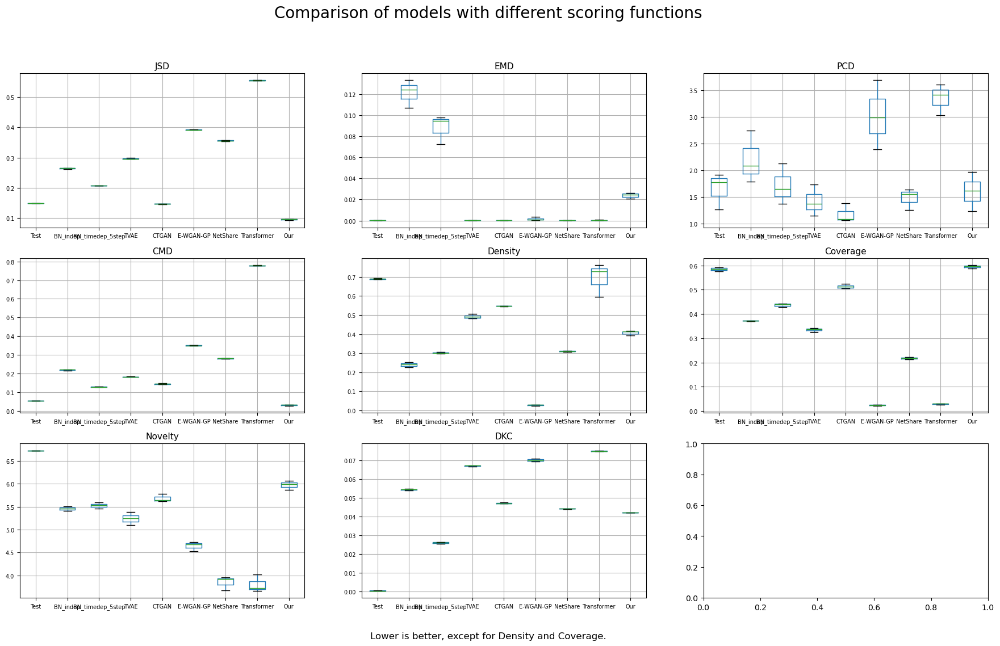

In [12]:
result = result.astype(float)

fig, axs = plt.subplots(3, 3, figsize=(22,12))

for i, metric in enumerate(result.index.get_level_values(0).drop_duplicates()):
    result.loc[metric,list(result.columns)].boxplot(ax = axs[i // 3, i % 3], fontsize=7)
    axs[i // 3, i % 3].set_title(metric, fontsize = 11)

fig.suptitle('Comparison of models with different scoring functions', fontsize = 20)
fig.text(.5, .05,'Lower is better, except for Density and Coverage.', fontsize = 12, ha = 'center')

# Time dependancy

In [14]:
datasets = [train, test, bn_indep, bn_timdep, tvae, ctgan, ewgangp, netshare, transformer, our]

In [15]:
for i in range(len(datasets)):
    datasets[i]["Date first seen"] = pd.to_datetime(datasets[i]['Date first seen'])
    datasets[i] = datasets[i].sort_values("Date first seen")
    datasets[i][continuous] = datasets[i][continuous].astype(int)
    #datasets[i].loc[(datasets[i]["Dst IP Addr"].str.contains("_")) & (datasets[i]["Dst IP Addr"] != "EXT_SERVER"),"Dst IP Addr"] = "IP_PUB"
    datasets[i].index=datasets[i].pop("Date first seen")
    datasets[i] = datasets[i][continuous+discrete]

## Numerical features

In [16]:
crrtime_2 = np.zeros((len(models), len(continuous)))

tr = datasets[0]

for i, m in enumerate(datasets[1:]):
    for j, c in enumerate(continuous):
        crrtime_2[i,j] = compare_acf_timerange(tr[c], m[c])

ctime = pd.DataFrame(crrtime_2, columns=continuous, index=models)

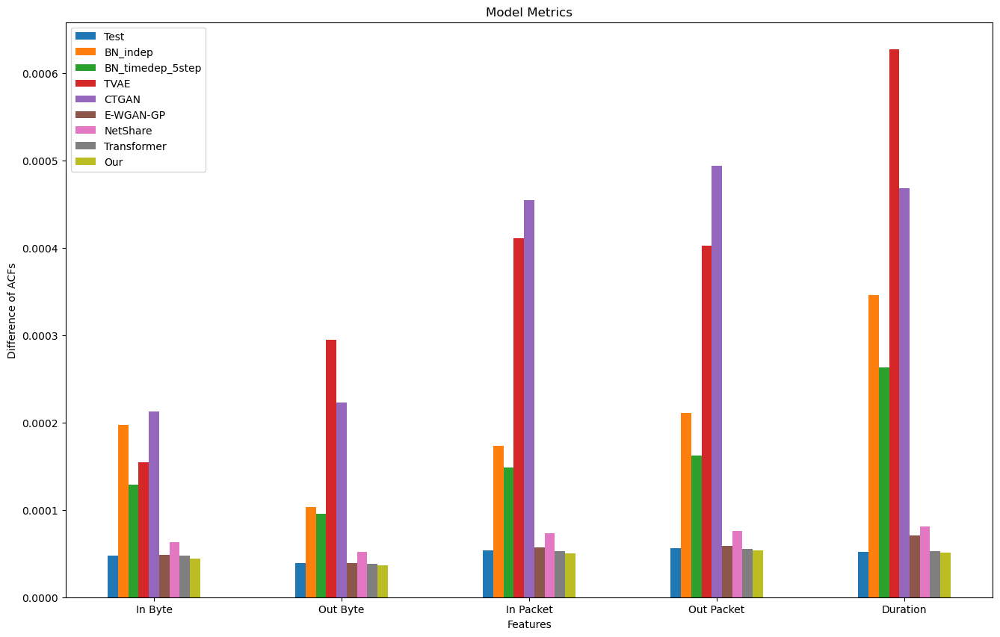

In [17]:
# Number of models and metrics
n_models = ctime.shape[0]
n_metrics = ctime.shape[1]

ind = np.arange(n_metrics) * (n_models + 2)
# Width of the bars (narrower)
width = 0.6  

# Create the plot
fig, ax = plt.subplots(figsize=(16, 10))

# Plotting each metric
for i, model in enumerate(ctime.index):
    # Calculate positions for the current metric's bars
    positions = ind + i * width
    # Plot the bars for the current metric
    ax.bar(positions, ctime.loc[model], width, label=model, capsize=5)

# Adding labels, title, and legend
ax.set_xlabel('Features')
ax.set_ylabel('Difference of ACFs')
ax.set_title('Model Metrics')
ax.set_xticks(ind + width * (n_models - 1) / 2)
ax.set_xticklabels(ctime.columns)
ax.legend()

plt.show()

## Categorical features

#### For the moment we launch the evaluation in a side job and read the results here. This is because the evaluation in itself, with the training of multiple models

In [41]:
avg= pd.read_csv("../results/temporal_dep_discrete_avg.csv", index_col=0)

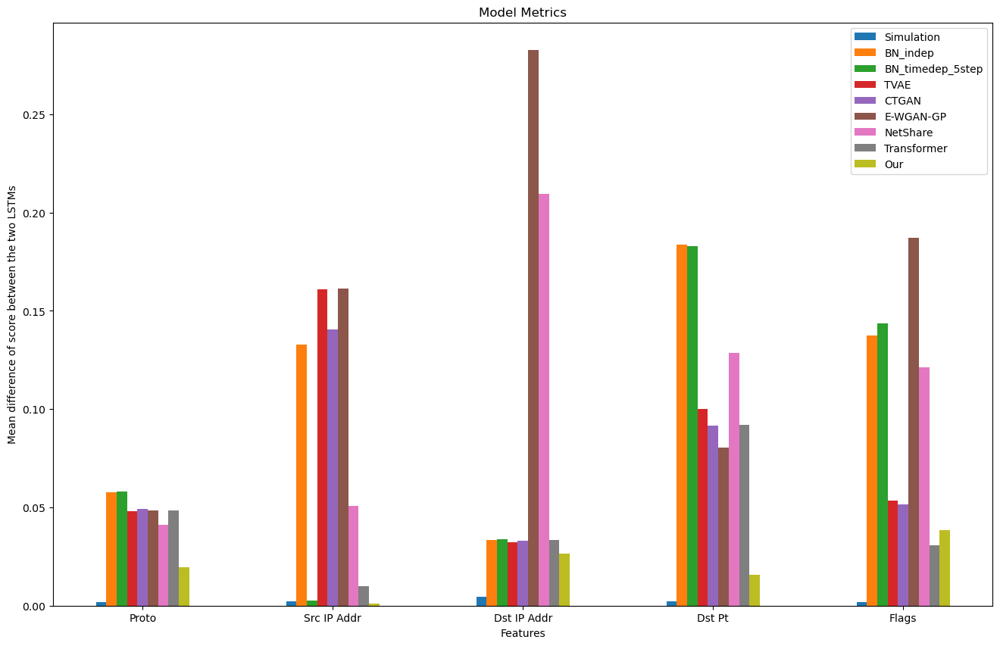

In [42]:
# Number of models and metrics
n_models = avg.shape[0]
n_metrics = avg.shape[1]

ind = np.arange(n_metrics) * (n_models + 2)
# Width of the bars (narrower)
width = 0.6  

# Create the plot
fig, ax = plt.subplots(figsize=(16, 10))

# Plotting each metric
for i, model in enumerate(avg.index):
    # Calculate positions for the current metric's bars
    positions = ind + i * width
    # Plot the bars for the current metric
    ax.bar(positions, avg.loc[model], width, label=model, capsize=5)

# Adding labels, title, and legend
ax.set_xlabel('Features')
ax.set_ylabel('Mean difference of score between the two LSTMs')
ax.set_title('Model Metrics')
ax.set_xticks(ind + width * (n_models - 1) / 2)
ax.set_xticklabels(avg.columns)
ax.legend()

plt.show()


# Pattern exploration

In [4]:
from model import Model
from attribute_value import AttributeType
from our_train_and_generate import PatternSampler

In [13]:
mod = Model.load_model("../models/CIDDS-our.pkl")

In [6]:
our = our.sort_values("Date first seen")

NameError: name 'our' is not defined

In [14]:
cs = mod.cover.get_cover_stats()

In [15]:
pattern_usages = cs.get_pattern_usage()

In [ ]:
ps = PatternSampler(pattern_usages)

2024-05-22 19:19:10,709 - INFO - Replacing existing CPD for 1-r0
2024-05-22 19:19:10,710 - INFO - Replacing existing CPD for 4-r0
2024-05-22 19:19:10,711 - INFO - Replacing existing CPD for 6-r0
2024-05-22 19:19:10,711 - INFO - Replacing existing CPD for 1-r1
2024-05-22 19:19:10,712 - INFO - Replacing existing CPD for 4-r1
2024-05-22 19:19:10,712 - INFO - Replacing existing CPD for 6-r1
2024-05-22 19:19:10,712 - INFO - Replacing existing CPD for 1-r2
2024-05-22 19:19:10,713 - INFO - Replacing existing CPD for 4-r2
2024-05-22 19:19:10,713 - INFO - Replacing existing CPD for 6-r2
2024-05-22 19:19:10,714 - INFO - Replacing existing CPD for 1-r3
2024-05-22 19:19:10,714 - INFO - Replacing existing CPD for 4-r3
2024-05-22 19:19:10,715 - INFO - Replacing existing CPD for 6-r3
2024-05-22 19:19:10,755 - INFO - Replacing existing CPD for 1-r0
2024-05-22 19:19:10,755 - INFO - Replacing existing CPD for 2-r0
2024-05-22 19:19:10,756 - INFO - Replacing existing CPD for 4-r0
2024-05-22 19:19:10,756 -

In [19]:
pattern_dic = {}
sort = {}
for (j, (patt, occ)) in enumerate(ps.pattern_distrib.items()):
    if len(patt.pattern)>1:
        fl = []
        for i, flow in enumerate(patt.pattern):
            columns = [mod.cover.dataset.col_name_map[c] for c in flow.pattern.keys()]
            v = [j.value if str(j).split(":")[0] == str(AttributeType.FIX) else j for j in flow.pattern.values()]
            v = [mod.cover.dataset.column_value_dict[columns[i]][k] if type(k)==int else k for i, k in enumerate(v)]
            fl.append(dict(zip(columns, v)))
        pattern_dic[j] = fl
        sort[j] = occ
pattern_dic = dict(sorted(pattern_dic.items(), key=lambda x:sort[x[0]], reverse=True))

In [20]:
idx = 0
idx = list(pattern_dic.keys())[idx]
print(idx, sort[idx]*len(pattern_dic[idx])*100)
print(pattern_dic[idx])

3112 0.02894900632535788
[{'Out Packet': 5, 'Flags': '.AP.S.', 'Proto': 'TCP', 'Dst Pt': 443.0, 'In Packet': 4, 'In Byte': 21, 'Src IP Addr': '192.168.200.9', 'Dst IP Addr': '14645_180', 'Out Byte': 26}, {'Out Packet': 5, 'Flags': '.AP.S.', 'Proto': 'TCP', 'Dst Pt': 443.0, 'In Packet': 4, 'In Byte': 21, 'Src IP Addr': '192.168.200.9', 'Dst IP Addr': '14645_180', 'Out Byte': 26, 'Duration': 15}]


In [126]:
our[our.pattern_idx == 7545]

,Date first seen,Proto,Src IP Addr,Dst IP Addr,Dst Pt,In Byte,In Packet,Out Byte,Out Packet,Flags,Duration,pattern_idx
513920,2017-04-11 15:53:02.055652123,TCP,192.168.220.15,10013_97,443.0,1758,13,2169,19,.AP.SF,0,7545
513921,2017-04-11 15:53:17.239704761,UDP,192.168.220.15,DNS,53.0,0,1,256,1,......,173,7545
513922,2017-04-11 15:53:17.373922726,TCP,192.168.220.15,10013_97,445.0,468,2,74,261868,.AP..F,0,7545
851486,2017-04-11 15:53:39.628210246,TCP,192.168.220.15,10377_192,443.0,1663,284294,149,18,.AP.SF,1,7545
851487,2017-04-11 15:53:54.847799500,UDP,192.168.220.15,DNS,53.0,0,1,5377,2,......,5,7545
851488,2017-04-11 15:53:54.974831748,TCP,192.168.220.4,10377_192,137.0,102,20,149,278341,.AP...,0,7545


In [122]:
pattern = idx
def highlight_sentiment(row):
    if row["pattern_idx"] == pattern:
        return ['background-color: red'] * len(row)
    else:
        return ['background-color: black'] * len(row)

our.iloc[177000:190000,:].style.apply(highlight_sentiment, axis=1)